In [431]:
import numpy as np
import pandas as pd
import scipy
import seaborn as sns

In [471]:
from scipy.stats import ttest_ind, chi2_contingency
from sklearn.metrics import classification_report
import statsmodels
from statsmodels import stats
from statsmodels.stats import weightstats

In [433]:
import matplotlib
from matplotlib import pyplot as plt
import pylab
from pylab import plot,show,legend,title,xlabel,ylabel

import sklearn
import pylab
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from imblearn.over_sampling import SMOTE
from sklearn.feature_selection import RFE
from sklearn.preprocessing import StandardScaler

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)

In [434]:
df = pd.read_csv('/content/data.csv')

In [435]:
df.columns = df.columns.str.replace(' ', '').str.replace('_', '')

In [436]:
df.head()

,Bankrupt?,ROA(C)beforeinterestanddepreciationbeforeinterest,ROA(A)beforeinterestand%aftertax,ROA(B)beforeinterestanddepreciationaftertax,OperatingGrossMargin,RealizedSalesGrossMargin,OperatingProfitRate,Pre-taxnetInterestRate,After-taxnetInterestRate,Non-industryincomeandexpenditure/revenue,Continuousinterestrate(aftertax),OperatingExpenseRate,Researchanddevelopmentexpenserate,Cashflowrate,Interest-bearingdebtinterestrate,Taxrate(A),NetValuePerShare(B),NetValuePerShare(A),NetValuePerShare(C),PersistentEPSintheLastFourSeasons,CashFlowPerShare,RevenuePerShare(Yuan¥),OperatingProfitPerShare(Yuan¥),PerShareNetprofitbeforetax(Yuan¥),RealizedSalesGrossProfitGrowthRate,OperatingProfitGrowthRate,After-taxNetProfitGrowthRate,RegularNetProfitGrowthRate,ContinuousNetProfitGrowthRate,TotalAssetGrowthRate,NetValueGrowthRate,TotalAssetReturnGrowthRateRatio,CashReinvestment%,CurrentRatio,QuickRatio,InterestExpenseRatio,Totaldebt/Totalnetworth,Debtratio%,Networth/Assets,Long-termfundsuitabilityratio(A),Borrowingdependency,Contingentliabilities/Networth,Operatingprofit/Paid-incapital,Netprofitbeforetax/Paid-incapital,Inventoryandaccountsreceivable/Netvalue,TotalAssetTurnover,AccountsReceivableTurnover,AverageCollectionDays,InventoryTurnoverRate(times),FixedAssetsTurnoverFrequency,NetWorthTurnoverRate(times),Revenueperperson,Operatingprofitperperson,Allocationrateperperson,WorkingCapitaltoTotalAssets,QuickAssets/TotalAssets,CurrentAssets/TotalAssets,Cash/TotalAssets,QuickAssets/CurrentLiability,Cash/CurrentLiability,CurrentLiabilitytoAssets,OperatingFundstoLiability,Inventory/WorkingCapital,Inventory/CurrentLiability,CurrentLiabilities/Liability,WorkingCapital/Equity,CurrentLiabilities/Equity,Long-termLiabilitytoCurrentAssets,RetainedEarningstoTotalAssets,Totalincome/Totalexpense,Totalexpense/Assets,CurrentAssetTurnoverRate,QuickAssetTurnoverRate,WorkingcapitcalTurnoverRate,CashTurnoverRate,CashFlowtoSales,FixedAssetstoAssets,CurrentLiabilitytoLiability,CurrentLiabilitytoEquity,EquitytoLong-termLiability,CashFlowtoTotalAssets,CashFlowtoLiability,CFOtoAssets,CashFlowtoEquity,CurrentLiabilitytoCurrentAssets,Liability-AssetsFlag,NetIncometoTotalAssets,TotalassetstoGNPprice,No-creditInterval,GrossProfittoSales,NetIncometoStockholder'sEquity,LiabilitytoEquity,DegreeofFinancialLeverage(DFL),InterestCoverageRatio(InterestexpensetoEBIT),NetIncomeFlag,EquitytoLiability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.256969e-04,0.0,0.458143,0.000725,0.0,0.147950,0.147950,0.147950,0.169141,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000327,0.263100,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820926e-04,1.165007e-04,0.032903,0.034164,0.392913,0.037135,0.672775,0.166673,0.190643,0.004094,0.001997,1.473360e-04,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,0.025592,0.903225,0.002022,0.064856,7.010000e+08,6.550000e+09,0.593831,4.580000e+08,0.671568,0.424206,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.897851e-04,0.0,0.461867,0.000647,0.0,0.182251,0.182251,0.182251,0.208944,0.318137,0.021144,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,6.110000e+09,0.000443,0.264516,0.376709,0.006016,0.004039,0.635172,0.012502,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,0.001286,0.004917,9.360000e+09,7.190000e+08,0.025484,0.006889,0.391590,0.012335,0.751111,0.127236,0.182419,0.014948,0.004136,1.383910e-03,0.056963,0.341106,0.289642,0.005210,0.308589,0.731975,0.329740,0.023947,0.931065,0.002226,0.025516,1.065198e-04,7.700000e+09,0.593916,2.490000e+09,0.671570,0.468828,0.308589,0.329740,0.120916,0.641100,0

In [437]:
df.isnull().sum()

Bankrupt?                                            0
ROA(C)beforeinterestanddepreciationbeforeinterest    0
ROA(A)beforeinterestand%aftertax                     0
ROA(B)beforeinterestanddepreciationaftertax          0
OperatingGrossMargin                                 0
RealizedSalesGrossMargin                             0
OperatingProfitRate                                  0
Pre-taxnetInterestRate                               0
After-taxnetInterestRate                             0
Non-industryincomeandexpenditure/revenue             0
Continuousinterestrate(aftertax)                     0
OperatingExpenseRate                                 0
Researchanddevelopmentexpenserate                    0
Cashflowrate                                         0
Interest-bearingdebtinterestrate                     0
Taxrate(A)                                           0
NetValuePerShare(B)                                  0
NetValuePerShare(A)                                  0
NetValuePe

In [438]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   Bankrupt?                                          6819 non-null   int64  
 1   ROA(C)beforeinterestanddepreciationbeforeinterest  6819 non-null   float64
 2   ROA(A)beforeinterestand%aftertax                   6819 non-null   float64
 3   ROA(B)beforeinterestanddepreciationaftertax        6819 non-null   float64
 4   OperatingGrossMargin                               6819 non-null   float64
 5   RealizedSalesGrossMargin                           6819 non-null   float64
 6   OperatingProfitRate                                6819 non-null   float64
 7   Pre-taxnetInterestRate                             6819 non-null   float64
 8   After-taxnetInterestRate                           6819 non-null   float64
 9   Non-indu

In [439]:
df.isnull().sum()/len(df)*100


Bankrupt?                                            0.0
ROA(C)beforeinterestanddepreciationbeforeinterest    0.0
ROA(A)beforeinterestand%aftertax                     0.0
ROA(B)beforeinterestanddepreciationaftertax          0.0
OperatingGrossMargin                                 0.0
RealizedSalesGrossMargin                             0.0
OperatingProfitRate                                  0.0
Pre-taxnetInterestRate                               0.0
After-taxnetInterestRate                             0.0
Non-industryincomeandexpenditure/revenue             0.0
Continuousinterestrate(aftertax)                     0.0
OperatingExpenseRate                                 0.0
Researchanddevelopmentexpenserate                    0.0
Cashflowrate                                         0.0
Interest-bearingdebtinterestrate                     0.0
Taxrate(A)                                           0.0
NetValuePerShare(B)                                  0.0
NetValuePerShare(A)            

In [440]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   Bankrupt?                                          6819 non-null   int64  
 1   ROA(C)beforeinterestanddepreciationbeforeinterest  6819 non-null   float64
 2   ROA(A)beforeinterestand%aftertax                   6819 non-null   float64
 3   ROA(B)beforeinterestanddepreciationaftertax        6819 non-null   float64
 4   OperatingGrossMargin                               6819 non-null   float64
 5   RealizedSalesGrossMargin                           6819 non-null   float64
 6   OperatingProfitRate                                6819 non-null   float64
 7   Pre-taxnetInterestRate                             6819 non-null   float64
 8   After-taxnetInterestRate                           6819 non-null   float64
 9   Non-indu

In [468]:
df[df.duplicated()].count()

Bankrupt?                                            0
ROA(C)beforeinterestanddepreciationbeforeinterest    0
ROA(A)beforeinterestand%aftertax                     0
ROA(B)beforeinterestanddepreciationaftertax          0
OperatingGrossMargin                                 0
RealizedSalesGrossMargin                             0
OperatingProfitRate                                  0
Pre-taxnetInterestRate                               0
After-taxnetInterestRate                             0
Non-industryincomeandexpenditure/revenue             0
Continuousinterestrate(aftertax)                     0
OperatingExpenseRate                                 0
Researchanddevelopmentexpenserate                    0
Cashflowrate                                         0
Interest-bearingdebtinterestrate                     0
Taxrate(A)                                           0
NetValuePerShare(B)                                  0
NetValuePerShare(A)                                  0
NetValuePe

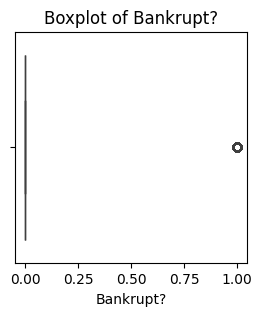

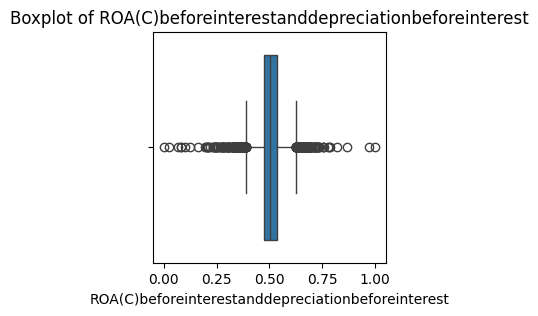

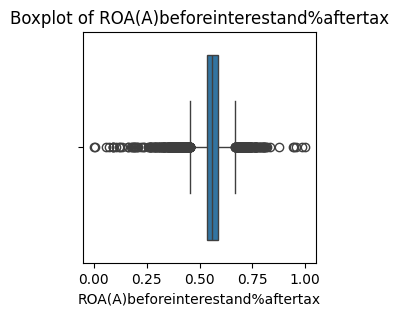

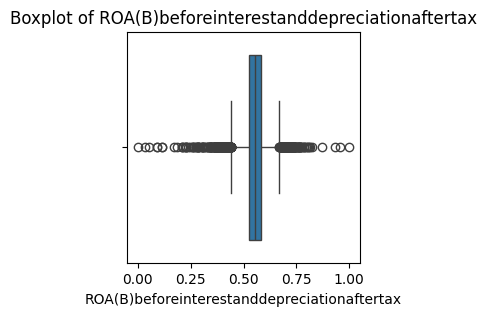

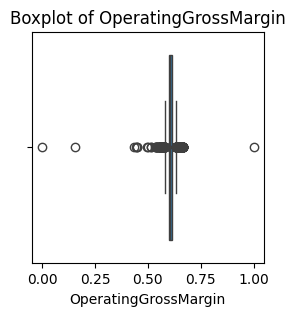

...

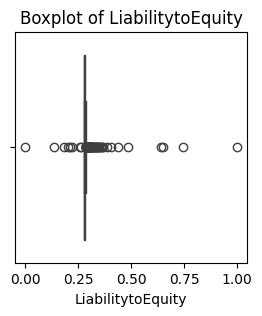

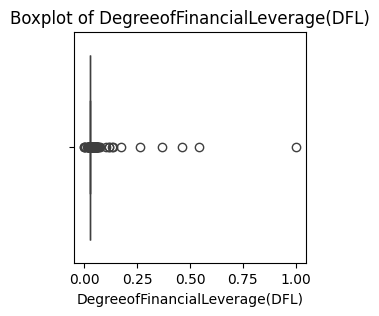

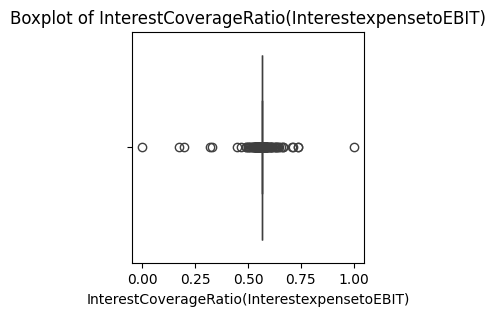

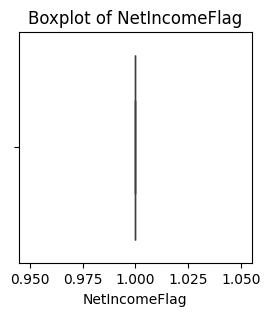

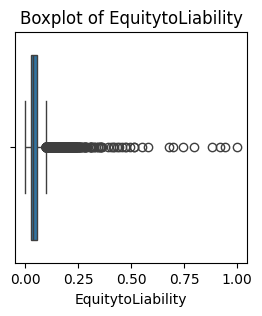

In [442]:
#checking for outliers
for column in df.columns:
    plt.figure(figsize=(3, 3))
    sns.boxplot(x=df[column])
    plt.title(f'Boxplot of {column}')
    plt.xlabel(column)
    plt.show()

In [443]:
def impute_outliers(df, column):
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    # Replace outliers with bounds
    df.loc[df[column] < lower_bound, column] = lower_bound
    df.loc[df[column] > upper_bound, column] = upper_bound

    return df

# List of columns to impute (excluding 'Bankrupt?')
columns_to_impute = df.columns.difference(['Bankrupt?','Liability-AssetsFlag','NetIncomeFlag'])

# Apply the imputation function to each column
for column in columns_to_impute:
    df = impute_outliers(df, column)

# Check the counts of 'Bankrupt?' after imputation
print(df['Bankrupt?'].value_counts())

Bankrupt?
0    6599
1     220
Name: count, dtype: int64


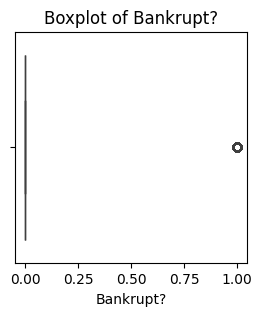

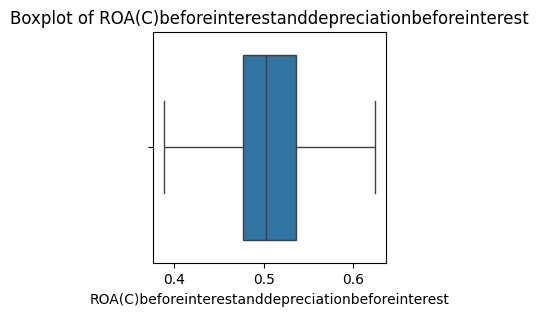

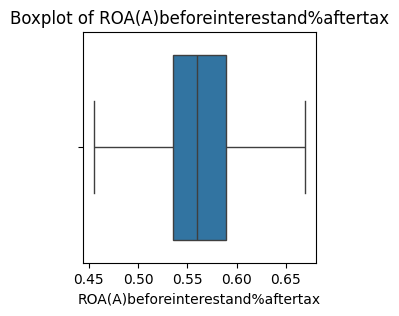

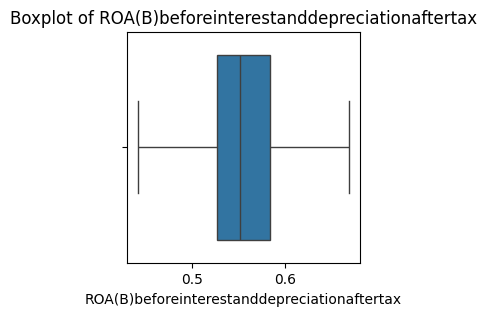

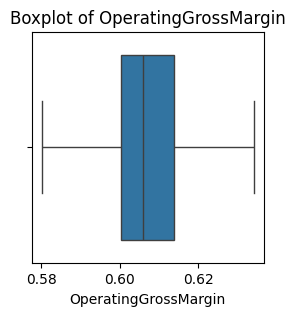

...

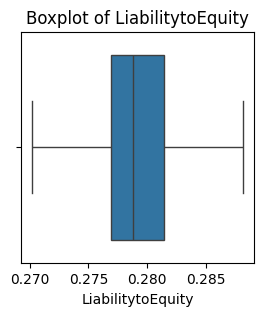

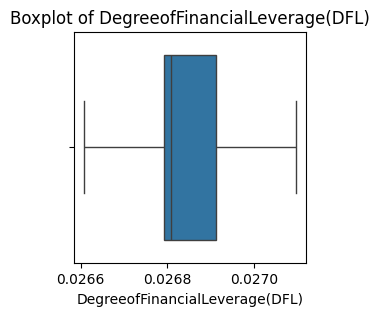

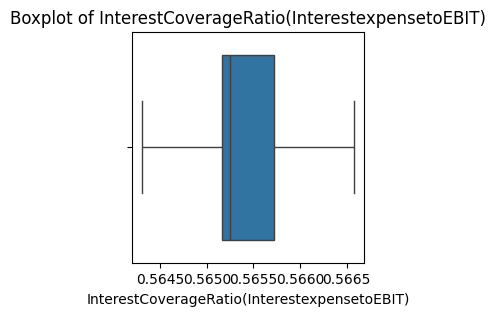

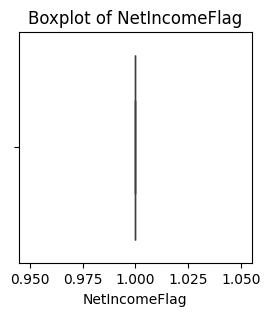

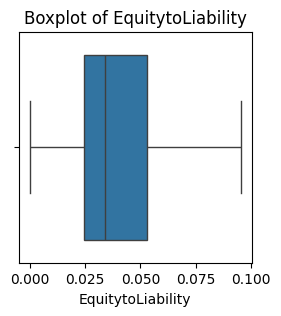

In [444]:
#after removing outlier
for column in df.columns:
    plt.figure(figsize=(3, 3))
    sns.boxplot(x=df[column])
    plt.title(f'Boxplot of {column}')
    plt.xlabel(column)
    plt.show()

In [445]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   Bankrupt?                                          6819 non-null   int64  
 1   ROA(C)beforeinterestanddepreciationbeforeinterest  6819 non-null   float64
 2   ROA(A)beforeinterestand%aftertax                   6819 non-null   float64
 3   ROA(B)beforeinterestanddepreciationaftertax        6819 non-null   float64
 4   OperatingGrossMargin                               6819 non-null   float64
 5   RealizedSalesGrossMargin                           6819 non-null   float64
 6   OperatingProfitRate                                6819 non-null   float64
 7   Pre-taxnetInterestRate                             6819 non-null   float64
 8   After-taxnetInterestRate                           6819 non-null   float64
 9   Non-indu

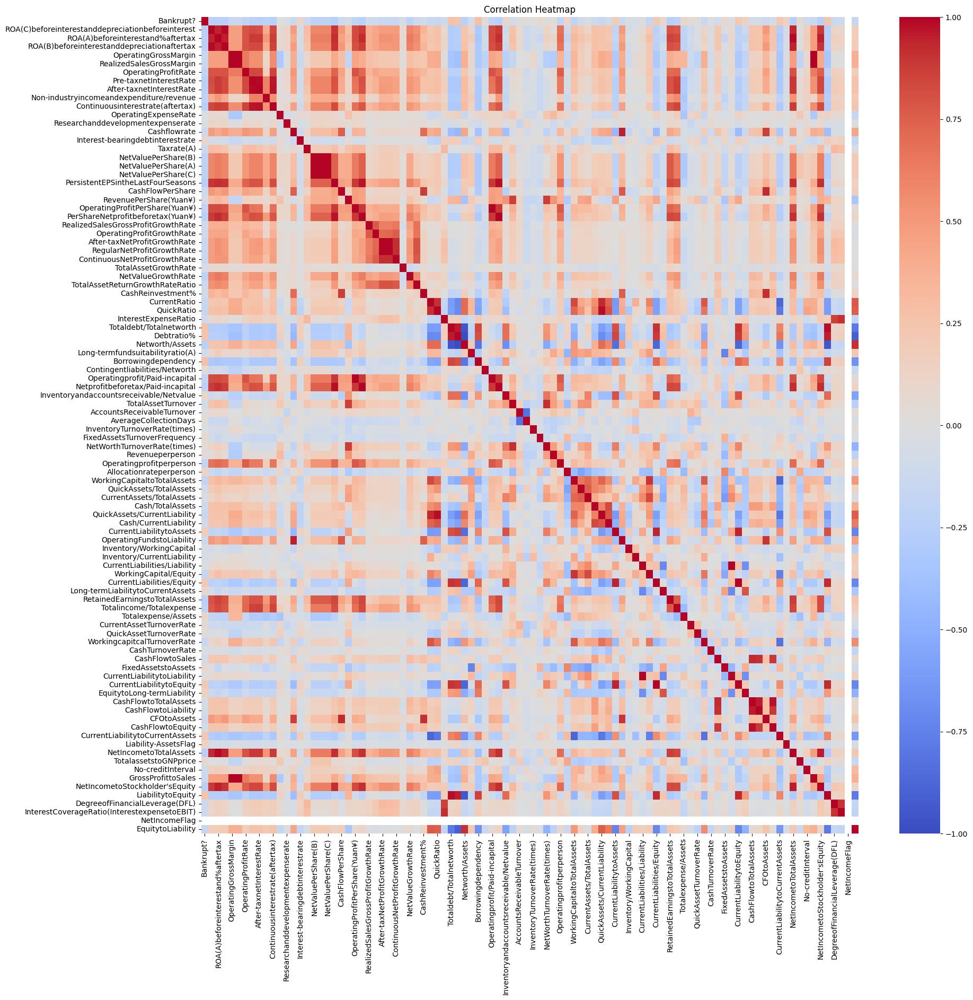

In [446]:
correlation = df.corr()
plt.figure(figsize=(20, 20))
sns.heatmap(correlation, annot=False, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


In [447]:
# 1. Generate Descriptive Statistics
target_desc_stats = df['Bankrupt?'].describe()
print(target_desc_stats)

count    6819.000000
mean        0.032263
std         0.176710
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: Bankrupt?, dtype: float64


In [448]:
df['Bankrupt?'].mode()

0    0
Name: Bankrupt?, dtype: int64

In [449]:
df['Bankrupt?'].value_counts()

Bankrupt?
0    6599
1     220
Name: count, dtype: int64

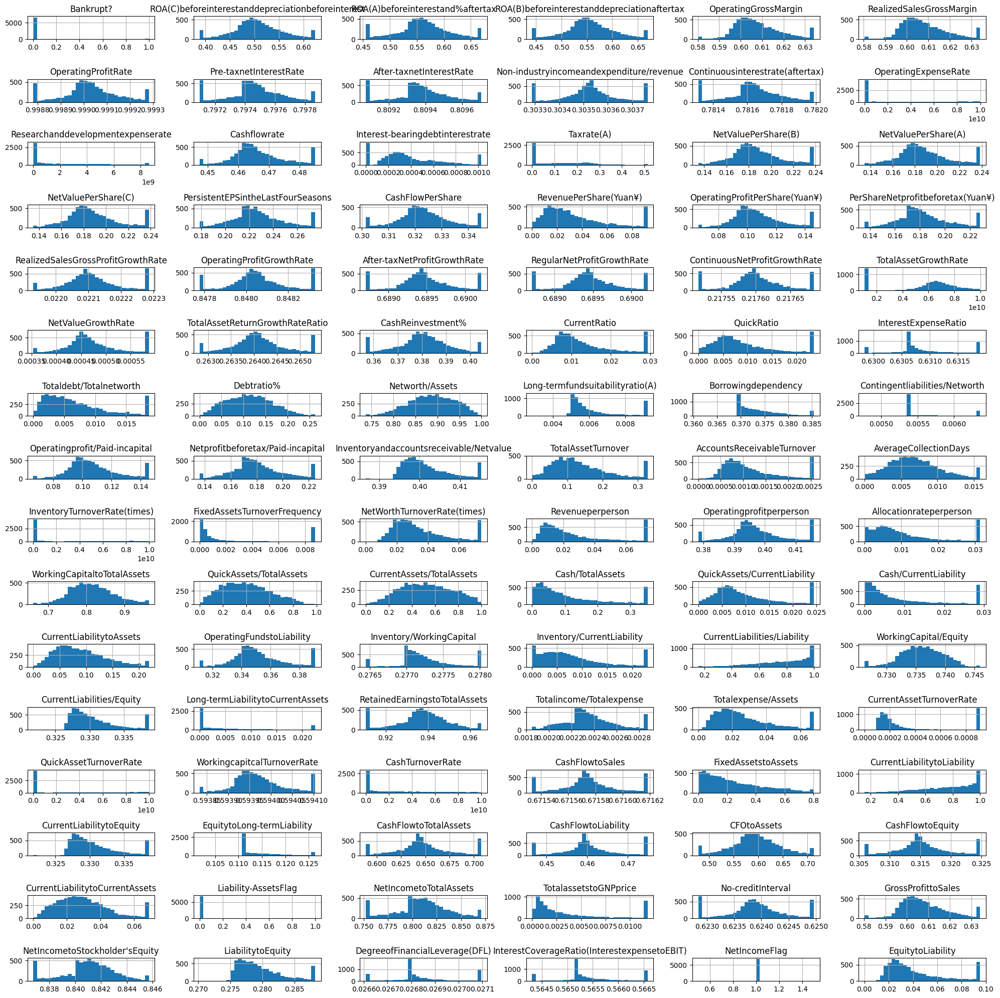

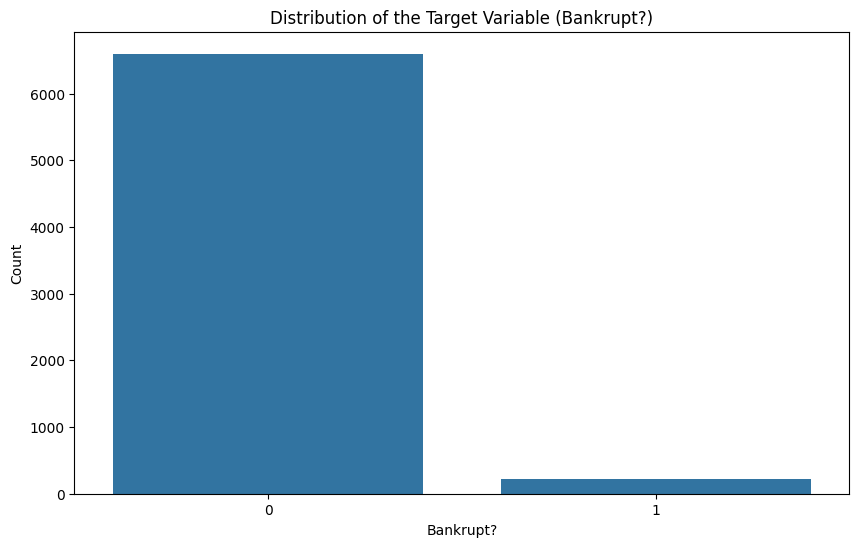

In [450]:
# 2. Visualize Feature Distributions
df.hist(bins=30, figsize=(20, 20), layout=(16, 6))
plt.tight_layout()
plt.show()

# Visualize distribution of the target variable
plt.figure(figsize=(10, 6))
sns.countplot(x='Bankrupt?', data=df)
plt.title('Distribution of the Target Variable (Bankrupt?)')
plt.xlabel('Bankrupt?')
plt.ylabel('Count')
plt.show()

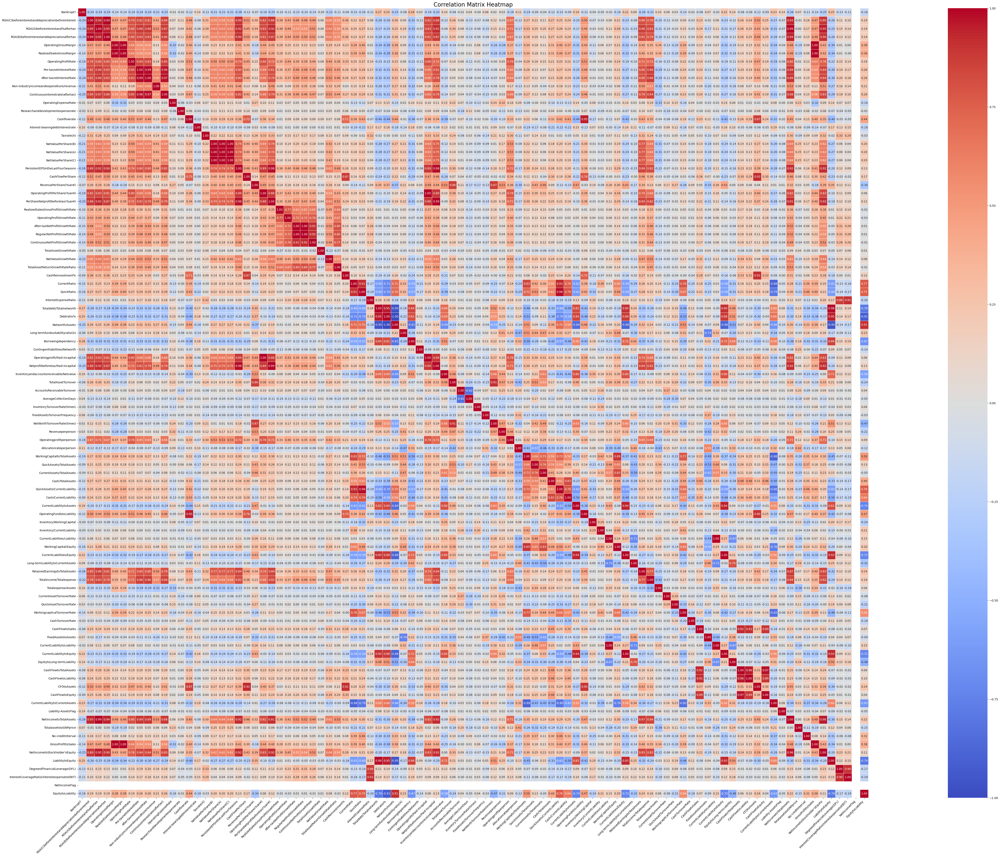

In [451]:
# 3. Analyze Relationships Between Features and the Target Variable

# Correlation Matrix
corr_matrix = df.corr()
plt.figure(figsize=(100, 50))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5, square=True)
plt.title('Correlation Matrix Heatmap', size=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.show()

In [452]:
# Hypothesis testing
significant_features = []
for column in df.select_dtypes(include=[np.number]).columns:
    if column != 'Bankrupt?':
        bankrupt = df[df['Bankrupt?'] == 1][column]
        non_bankrupt = df[df['Bankrupt?'] == 0][column]
        t_stat, p_val = ttest_ind(bankrupt, non_bankrupt)
        if p_val < 0.05:
            significant_features.append(column)
        print(f'{column}: t-statistic={t_stat}, p-value={p_val}')

print(f'Significant features: {len(significant_features)}')

ROA(C)beforeinterestanddepreciationbeforeinterest: t-statistic=-20.371000246550334, p-value=1.3480464196848798e-89
ROA(A)beforeinterestand%aftertax: t-statistic=-20.36708962978169, p-value=1.453424003163958e-89
ROA(B)beforeinterestanddepreciationaftertax: t-statistic=-20.59226229040652, p-value=1.867512034084068e-91
OperatingGrossMargin: t-statistic=-11.677652430250529, p-value=3.2823739125123346e-31
RealizedSalesGrossMargin: t-statistic=-11.61220032059553, p-value=6.967922607227421e-31
OperatingProfitRate: t-statistic=-16.315267033012436, p-value=9.863440509107752e-59
Pre-taxnetInterestRate: t-statistic=-20.235075270990965, p-value=1.8306696788047566e-88
After-taxnetInterestRate: t-statistic=-20.365632811201365, p-value=1.4947479061257782e-89
Non-industryincomeandexpenditure/revenue: t-statistic=-18.132844472521544, p-value=8.370733607811912e-72
Continuousinterestrate(aftertax): t-statistic=-21.189549801114605, p-value=1.4678863402201738e-96
OperatingExpenseRate: t-statistic=-0.502271

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


In [477]:
x1=df['QuickAssets/TotalAssets']
x2=df['CurrentAssets/TotalAssets']
z =weightstats.ztest(x1,x2,value=0)
print(z)
if z[1] < 0.05:
    print("Conclusion: There is a significant relationship between the variables.")
else:
    print("Conclusion: There is no significant relationship between the variables.")

(-33.92877900160208, 2.5080345806481248e-252)
Conclusion: There is a significant relationship between the variables.


In [476]:
# Create a contingency table (cross-tabulation)
contingency_table = pd.crosstab(df['Bankrupt?'], df['Liability-AssetsFlag'])

# Perform Chi-square test of independence
chi2, p_value, dof, expected = chi2_contingency(contingency_table)

# Print test results
print(f"Chi-square statistic: {chi2}")
print(f"P-value: {p_value}")
print(f"Degrees of freedom: {dof}")
print("Expected frequencies:")
print(expected)

if p_value < 0.05:
    print("Conclusion: There is a significant relationship between the variables.")
else:
    print("Conclusion: There is no significant relationship between the variables.")

Chi-square statistic: 110.13807127769104
P-value: 9.139776609482457e-26
Degrees of freedom: 1
Expected frequencies:
[[6.59125810e+03 7.74189764e+00]
 [2.19741898e+02 2.58102361e-01]]
Conclusion: There is a significant relationship between the variables.


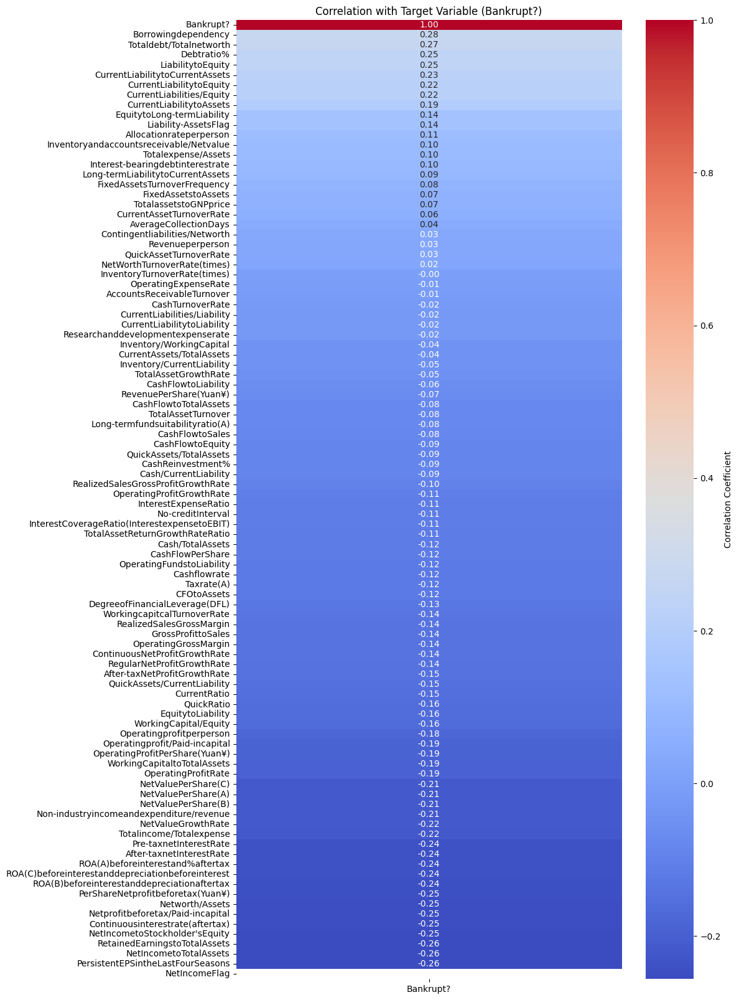

In [454]:
# Compute the correlation matrix
correlation_matrix = df.corr()
# Extract the correlation of each feature with the target variable
target_correlation = correlation_matrix['Bankrupt?'].sort_values(ascending=False)

# Plot the correlations with the target variable
plt.figure(figsize=(10, 20))
sns.heatmap(target_correlation.to_frame(), annot=True, fmt=".2f", cmap='coolwarm', cbar_kws={'label': 'Correlation Coefficient'})
plt.title('Correlation with Target Variable (Bankrupt?)')
plt.show()
target_correlation = correlation_matrix['Bankrupt?']
(target_correlation).sort_values(ascending=False) #printing correlation of each column with target column 'Bankrupt? '
sorted_correlations = correlation_matrix['Bankrupt?'].abs().sort_values(ascending=False)
#used abs to convert negative values into postitve and sort the values in descending order



In [455]:
df.shape

(6819, 96)

In [456]:
# Separate the features and the target variable
X = df.drop(columns=['Bankrupt?'])  # Features
y = df['Bankrupt?']  # Target variable

# Splitting data into training (80%) and testing (20%) sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [457]:
X_train.head()

,ROA(C)beforeinterestanddepreciationbeforeinterest,ROA(A)beforeinterestand%aftertax,ROA(B)beforeinterestanddepreciationaftertax,OperatingGrossMargin,RealizedSalesGrossMargin,OperatingProfitRate,Pre-taxnetInterestRate,After-taxnetInterestRate,Non-industryincomeandexpenditure/revenue,Continuousinterestrate(aftertax),OperatingExpenseRate,Researchanddevelopmentexpenserate,Cashflowrate,Interest-bearingdebtinterestrate,Taxrate(A),NetValuePerShare(B),NetValuePerShare(A),NetValuePerShare(C),PersistentEPSintheLastFourSeasons,CashFlowPerShare,RevenuePerShare(Yuan¥),OperatingProfitPerShare(Yuan¥),PerShareNetprofitbeforetax(Yuan¥),RealizedSalesGrossProfitGrowthRate,OperatingProfitGrowthRate,After-taxNetProfitGrowthRate,RegularNetProfitGrowthRate,ContinuousNetProfitGrowthRate,TotalAssetGrowthRate,NetValueGrowthRate,TotalAssetReturnGrowthRateRatio,CashReinvestment%,CurrentRatio,QuickRatio,InterestExpenseRatio,Totaldebt/Totalnetworth,Debtratio%,Networth/Assets,Long-termfundsuitabilityratio(A),Borrowingdependency,Contingentliabilities/Networth,Operatingprofit/Paid-incapital,Netprofitbeforetax/Paid-incapital,Inventoryandaccountsreceivable/Netvalue,TotalAssetTurnover,AccountsReceivableTurnover,AverageCollectionDays,InventoryTurnoverRate(times),FixedAssetsTurnoverFrequency,NetWorthTurnoverRate(times),Revenueperperson,Operatingprofitperperson,Allocationrateperperson,WorkingCapitaltoTotalAssets,QuickAssets/TotalAssets,CurrentAssets/TotalAssets,Cash/TotalAssets,QuickAssets/CurrentLiability,Cash/CurrentLiability,CurrentLiabilitytoAssets,OperatingFundstoLiability,Inventory/WorkingCapital,Inventory/CurrentLiability,CurrentLiabilities/Liability,WorkingCapital/Equity,CurrentLiabilities/Equity,Long-termLiabilitytoCurrentAssets,RetainedEarningstoTotalAssets,Totalincome/Totalexpense,Totalexpense/Assets,CurrentAssetTurnoverRate,QuickAssetTurnoverRate,WorkingcapitcalTurnoverRate,CashTurnoverRate,CashFlowtoSales,FixedAssetstoAssets,CurrentLiabilitytoLiability,CurrentLiabilitytoEquity,EquitytoLong-termLiability,CashFlowtoTotalAssets,CashFlowtoLiability,CFOtoAssets,CashFlowtoEquity,CurrentLiabilitytoCurrentAssets,Liability-AssetsFlag,NetIncometoTotalAssets,TotalassetstoGNPprice,No-creditInterval,GrossProfittoSales,NetIncometoStockholder'sEquity,LiabilitytoEquity,DegreeofFinancialLeverage(DFL),InterestCoverageRatio(InterestexpensetoEBIT),NetIncomeFlag,EquitytoLiability
3759,0.498513,0.542848,0.544622,0.599194,0.599036,0.998986,0.797412,0.809330,0.303528,0.781593,7.000000e+09,2.700000e+09,0.467994,0.000281,0.219962,0.197337,0.197337,0.197337,0.221046,0.329844,0.052286,0.101376,0.175943,0.022024,0.847952,0.689188,0.689188,0.217570,5.560000e+09,0.000433,0.263600,0.379885,0.009253,0.005780,0.631895,0.010735,0.159990,0.840010,0.005262,0.378194,0.006362,0.101324,0.174911,0.402892,0.130435,0.000820,0.007710,1.119688e-04,0.000191,0.040645,0.020366,0.393659,0.013654,0.785009,0.235713,0.356457,0.032719,0.005957,0.002388,0.072399,0.349242,0.277494,0.008863,0.424038,0.735010,0.330333,0.022515,0.940112,0.002299,0.013353,0.000913,6.390000e+09,0.593941,2.560000e+09,0.671571,0.373442,0.424038,0.330333,0.126365,0.640097,0.458822,0.608985,0.313993,0.031490,0,0.801313,0.005821,0.623649,0.599196,0.840580,0.282564,0.027096,0.566574,1,0.022512
1782,0.506606,0.562309,0.558863,0.609334,0.609334,0.999027,0.797450,0.809375,0.303508,0.781637,1.938068e-04,1.353189e-04,0.460732,0.000164,0.000000,0.173697,0.173697,0.173697,0.223882,0.316156,0.029297,0.104307,0.177299,0.022159,0.848046,0.689407,0.689407,0.217595,1.065000e+09,0.000469,0.264168,0.373151,0.011845,0.007728,0.630770,0.007986,0.137981,0.862019,0.009253,0.374378,0.005366,0.104304,0.176314,0.409016,0.160420,0.000625,0.010125,5.870000e+09,0.005545,0.037419,0.026597,0.397854,0.000664,0.871387,0.647349,0.900840,0.207601,0.008227,0.007710,0.142719,0.338721,0.277293,0.009691,0.982763,0.741265,0.333230,0.000000,0.937921,0.002312,0.031074,0.000268,1.951601e-04,0.594009,1.680341e-04,0.671609,0.013450,0.982763,0.333230,0.110933,0.702293,0.470

In [458]:
# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)



In [459]:
# Apply SMOTE to the training data if dealing with imbalanced classes
sm = SMOTE(random_state=42)
X_train_res, y_train_res = sm.fit_resample(X_train_scaled, y_train)


In [460]:
# Feature selection using RFE
num_features_to_select = 30  # Adjust this number based on your dataset size and complexity
rfe = RFE(estimator=LogisticRegression(max_iter=1000, random_state=42), n_features_to_select=num_features_to_select)
rfe.fit(X_train_res, y_train_res)

# Get selected feature indices
selected_indices = rfe.get_support(indices=True)

# Subset features based on selected indices
X_train_selected = X_train_res[:, selected_indices]
X_test_selected = X_test_scaled[:, selected_indices]  # Apply the same subset to the test set



Model Evaluation Metrics with selected features:
Accuracy: 0.8819648093841642
Confusion Matrix:
 [[1166  147]
 [  14   37]]
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.89      0.94      1313
           1       0.20      0.73      0.31        51

    accuracy                           0.88      1364
   macro avg       0.59      0.81      0.63      1364
weighted avg       0.96      0.88      0.91      1364



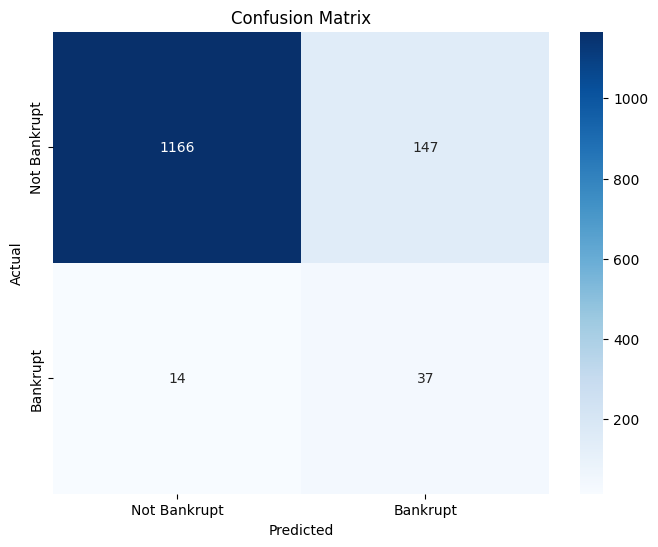

In [461]:
# Build logistic regression model with selected features
model_selected = LogisticRegression(max_iter=1000, random_state=42)
model_selected.fit(X_train_selected, y_train_res)

# Make predictions on the test set
y_pred_selected = model_selected.predict(X_test_selected)

# Evaluate the model with selected features
print("\nModel Evaluation Metrics with selected features:")
print("Accuracy:", accuracy_score(y_test, y_pred_selected))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_selected))
print("Classification Report:\n", classification_report(y_test, y_pred_selected))

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred_selected)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Bankrupt', 'Bankrupt'], yticklabels=['Not Bankrupt', 'Bankrupt'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
#Accuracy: The overall accuracy of the model is 88.20%. This means that the model correctly predicts the outcome (bankrupt or not bankrupt) for 88.20% of the instances in the dataset.
#True Positives (TP): 37
#These are instances predicted as bankrupt (class 1) that are actually bankrupt.
#False Positives (FP): 147
#These are instances predicted as bankrupt (class 1) that are actually not bankrupt (class 0).
#True Negatives (TN): 1166
#These are instances predicted as not bankrupt (class 0) that are actually not bankrupt.
#False Negatives (FN): 14
#These are instances predicted as not bankrupt (class 0) that are actually bankrupt (class 1).
#Precision for class 1 (bankrupt): 0.20
#Out of all instances predicted as bankrupt, only 20% are actually bankrupt.
#Recall for class 1: 0.73
#Out of all actual bankrupt instances, the model correctly identifies 73%.



Model Evaluation Metrics on Training Data with selected features:
Accuracy: 0.9219636776390465
Confusion Matrix:
 [[4740  546]
 [ 279 5007]]
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.90      0.92      5286
           1       0.90      0.95      0.92      5286

    accuracy                           0.92     10572
   macro avg       0.92      0.92      0.92     10572
weighted avg       0.92      0.92      0.92     10572



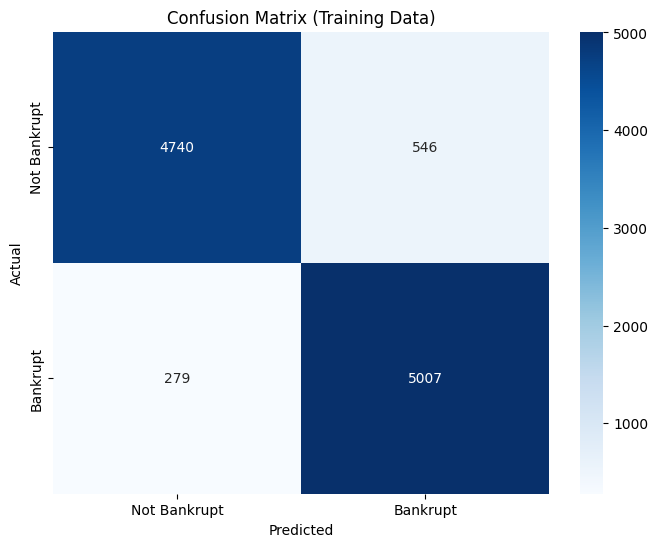

In [462]:
# Get selected feature indices
selected_indices = rfe.get_support(indices=True)

# Make predictions on the training set
y_pred_train_selected = model_selected.predict(X_train_selected)




# Evaluate the model with selected features on training data
print("\nModel Evaluation Metrics on Training Data with selected features:")
print("Accuracy:", accuracy_score(y_train_res, y_pred_train_selected))
print("Confusion Matrix:\n", confusion_matrix(y_train_res, y_pred_train_selected))
print("Classification Report:\n", classification_report(y_train_res, y_pred_train_selected))

# Plot confusion matrix
cm = confusion_matrix(y_train_res, y_pred_train_selected)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Bankrupt', 'Bankrupt'], yticklabels=['Not Bankrupt', 'Bankrupt'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Training Data)')
plt.show()

In [ ]:
#Accuracy: The overall accuracy of the model on the training data is 92.20%. This indicates that the model correctly predicts the outcome (bankrupt or not bankrupt) for 92.20% of the instances in the training dataset.
#True Positives (TP): 5007
#These are instances predicted as bankrupt (class 1) that are actually bankrupt.
#False Positives (FP): 546
#These are instances predicted as bankrupt (class 1) that are actually not bankrupt (class 0).
#True Negatives (TN): 4740
#These are instances predicted as not bankrupt (class 0) that are actually not bankrupt.
#False Negatives (FN): 279
#These are instances predicted as not bankrupt (class 0) that are actually bankrupt (class 1).
#Precision for class 1 (bankrupt): 0.90
#Out of all instances predicted as bankrupt, 90% are actually bankrupt.
#Recall for class 1: 0.95
#Out of all actual bankrupt instances, the model correctly identifies 95%.

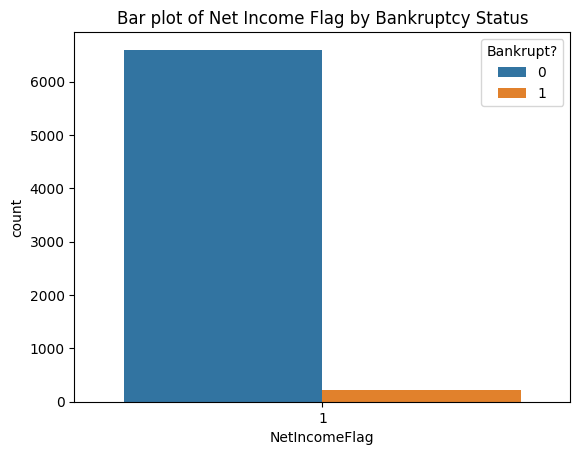

In [463]:
#EDA
sns.countplot(data=df, x='NetIncomeFlag', hue='Bankrupt?')
plt.title('Bar plot of Net Income Flag by Bankruptcy Status')
plt.show()


In [ ]:
#more than 6000 companies are not bankrupt

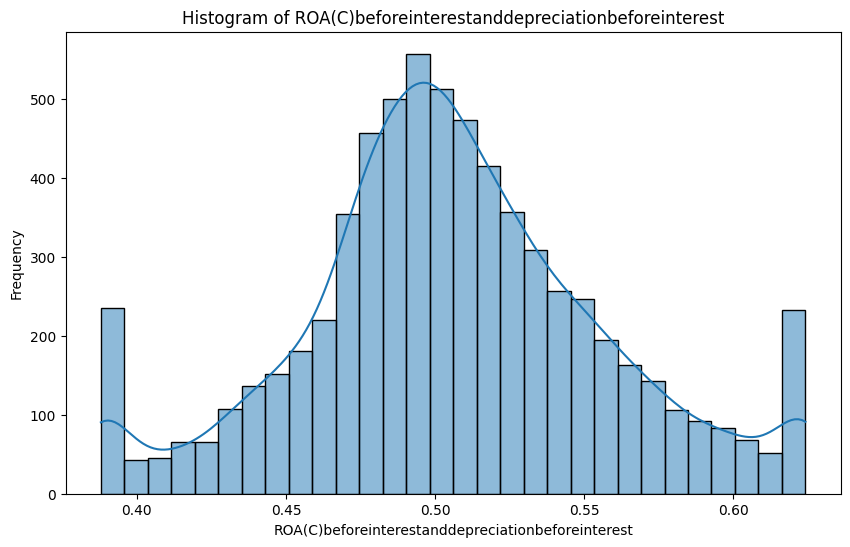

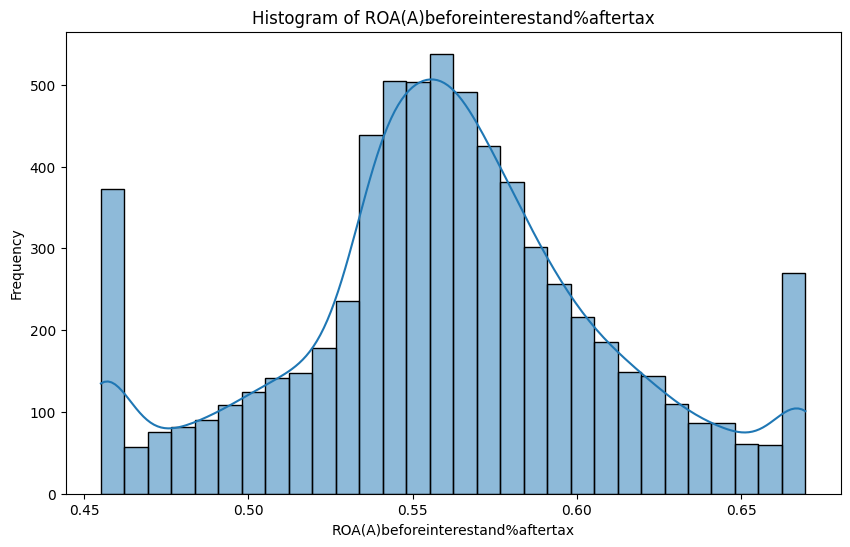

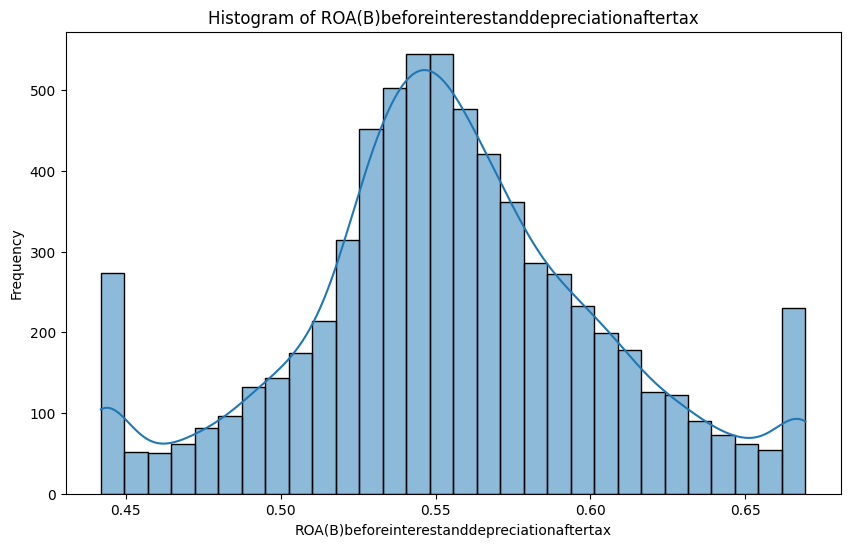

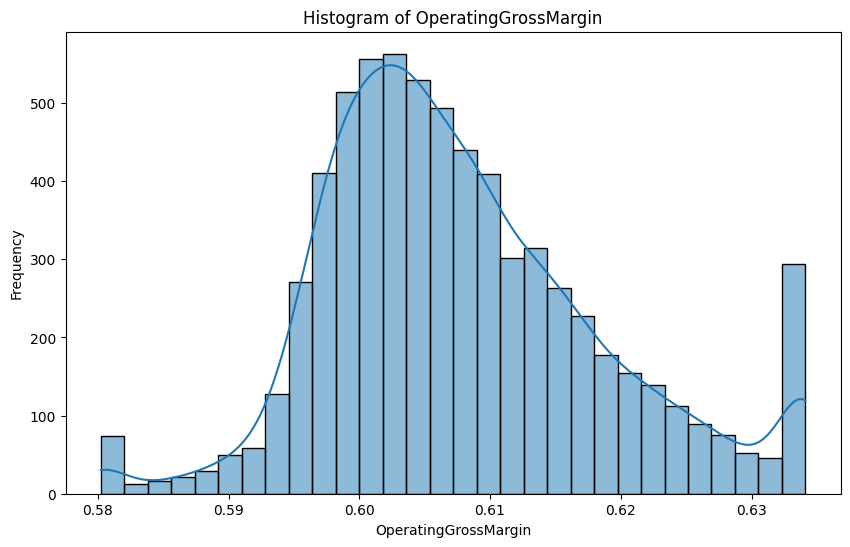

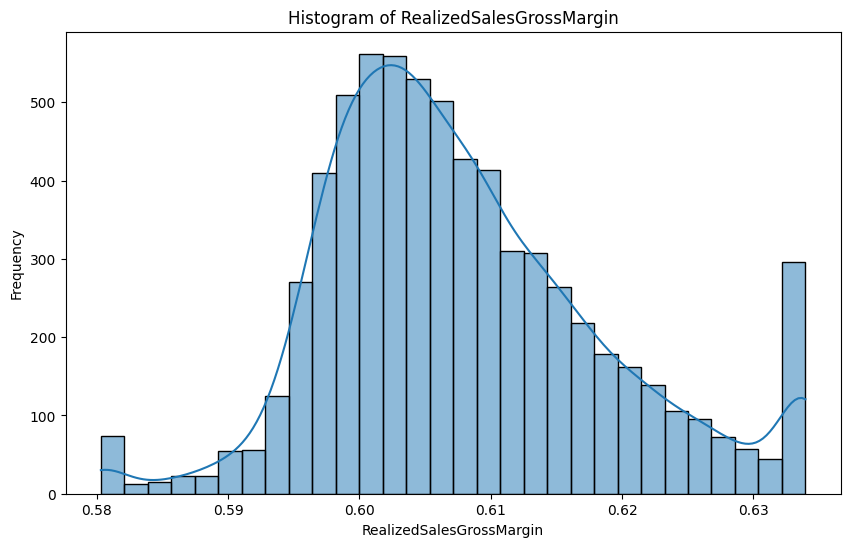

...

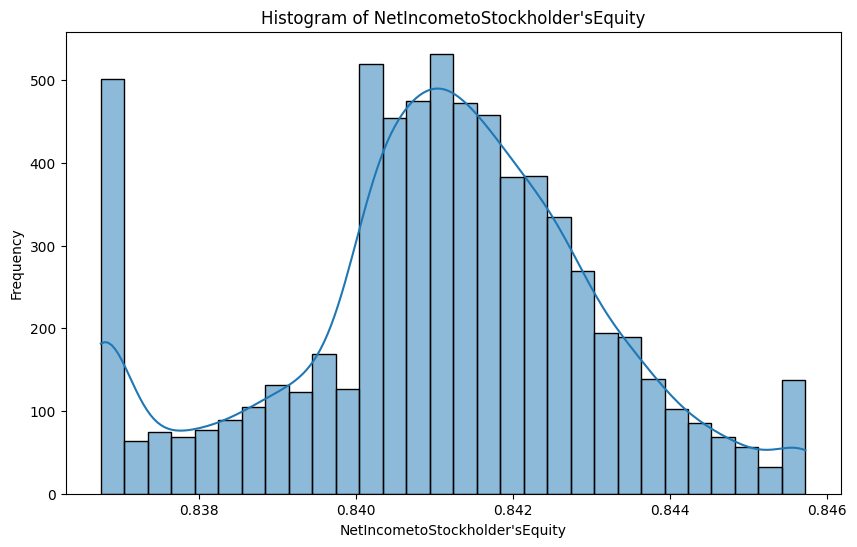

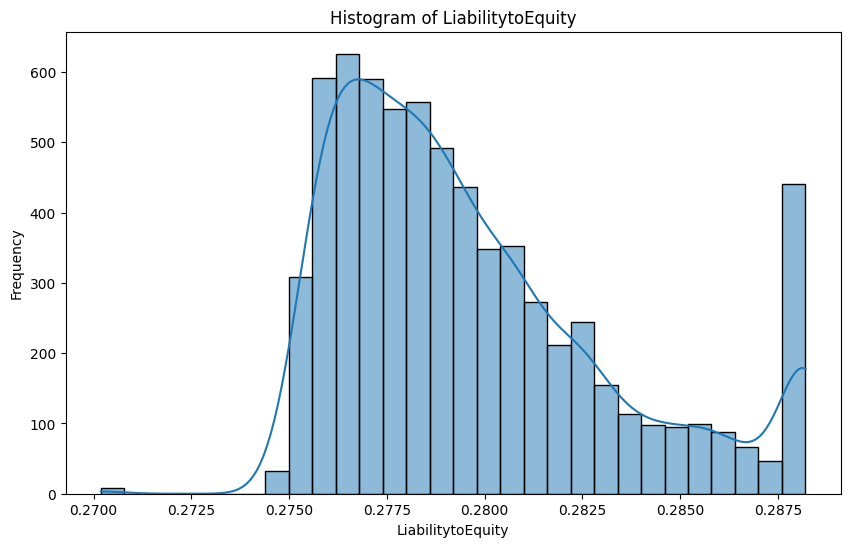

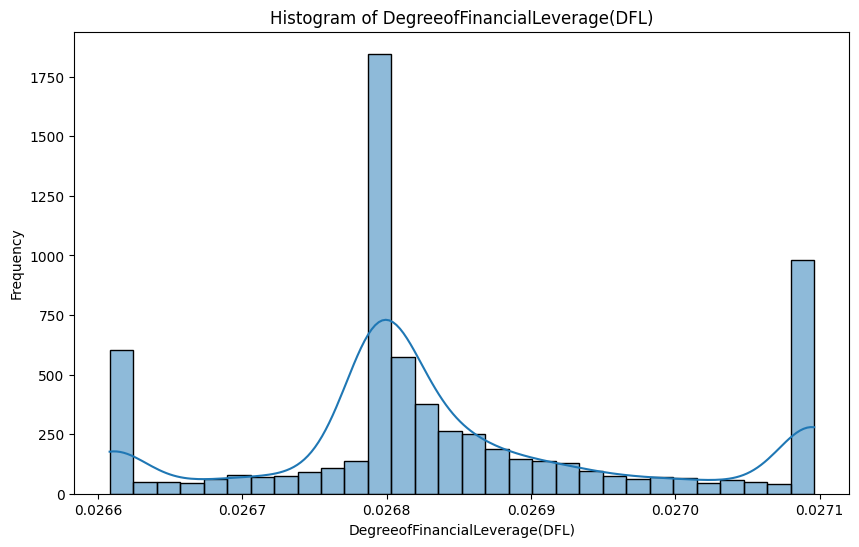

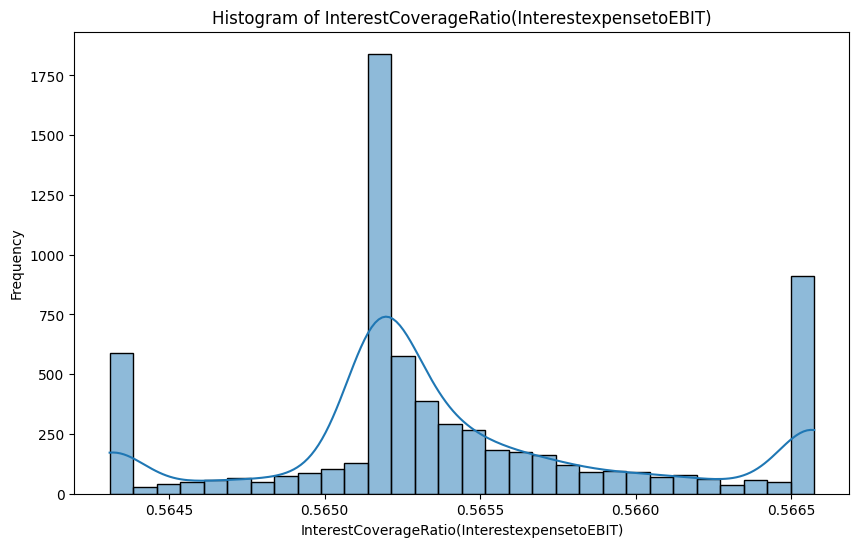

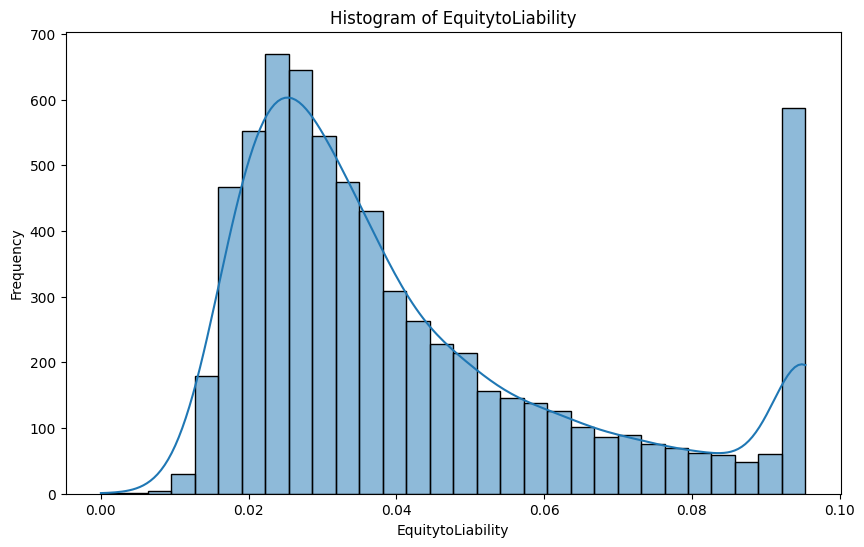

In [464]:
num_columns = df.dtypes[df.dtypes != 'int64'].index
df[num_columns].columns.tolist()

for column in num_columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(df[column], kde=True, bins=30)
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()


Liability-AssetsFlag  Bankrupt?
0                     0            6597
                      1             214
1                     1               6
                      0               2
Name: count, dtype: int64


<Axes: xlabel='Liability-AssetsFlag', ylabel='count'>

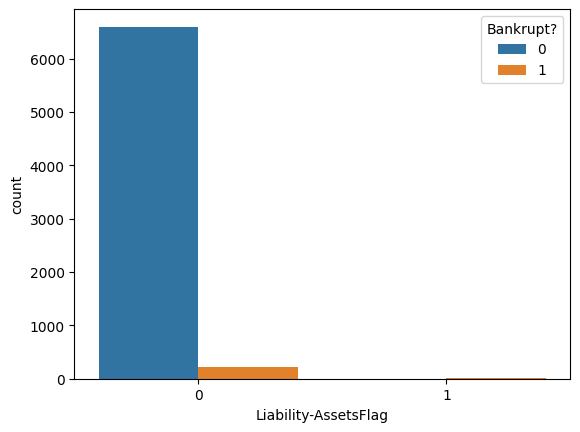

In [465]:
#Finding bankrupt companies on the basis of liability-assets flag
print(df[['Liability-AssetsFlag', 'Bankrupt?']].value_counts())
sns.countplot(x='Liability-AssetsFlag', hue='Bankrupt?', data=df)

In [ ]:
#here we can say that company having liability assets most of them havent gone bankrupt

NetIncomeFlag
1    6819
Name: count, dtype: int64


<Axes: xlabel='NetIncomeFlag', ylabel='count'>

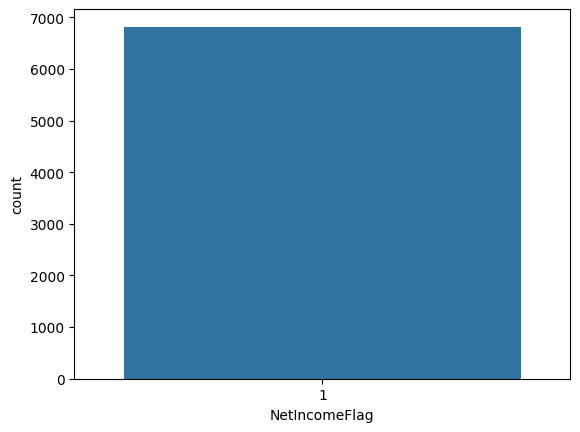

In [466]:
print(df.NetIncomeFlag.value_counts())
sns.countplot(x='NetIncomeFlag',data=df)


In [ ]:
#the data is imbalance as it only has one value so we can drop this data in feature selection

In [489]:
#Summary / Recommendation
#as the dataset was imbalance we had to use balancing techniques
#to improve the quality of the target variable df.bankrupt, where bankrupt is represented as 1 and not bankrupt as 0

#Collect More Data: If feasible, acquiring more data, especially instances of bankrupt companies (class 1), can help balance the dataset. This can provide the model with more examples to learn from and improve its ability to distinguish between the classes.

#Resampling Techniques: Since the dataset is imbalanced, resampling techniques can be employed:
#Upsampling (Over-sampling): Increase the number of instances in the minority class (class 1, bankrupt) by duplicating or generating synthetic examples (e.g., using SMOTE - Synthetic Minority Over-sampling Technique).
#Downsampling (Under-sampling): Decrease the number of instances in the majority class (class 0, not bankrupt) by randomly removing instances.

#Use of Different Algorithms: Some machine learning algorithms are more robust to class imbalance than others. Consider using algorithms that handle imbalanced datasets well, such as ensemble methods like Random Forests or gradient boosting algorithms (e.g., XGBoost, LightGBM), which inherently manage class imbalance through their training process.

#Feature Engineering: Enhance the features used in the model. Ensure they are informative and relevant to the prediction task. Feature selection techniques can help focus on the most predictive attributes and potentially improve model performance.

#Evaluation Metrics: Choose appropriate evaluation metrics that are sensitive to the class imbalance, such as precision, recall, F1-score, or area under the ROC curve (AUC-ROC). These metrics provide a clearer picture of how well the model performs across both classes.

#Cross-validation: Use cross-validation techniques, such as stratified K-fold cross-validation, to ensure the model's performance metrics are robust and generalize well to unseen data.

#Domain Expertise: Incorporate domain knowledge to refine the definition of bankrupt and not bankrupt. This can help in better defining features and understanding the nuances that contribute to bankruptcy.

#conclusion: using n number of parameters again and again by try and test we achieved maximum accuracy 88% by using top 30 featues by RFE method